Image shape: (512, 512), dtype: float64
Pixel range: [25.0, 245.0]


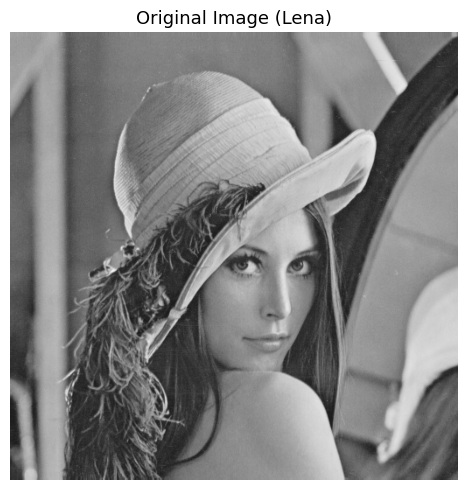

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pywt
from scipy.stats import norm
import warnings
warnings.filterwarnings('ignore')

# ── Load image ──────────────────────────────────────────────
img_bgr = cv2.imread('input.png')
if img_bgr is None:
    # Generate a synthetic lena-like grayscale test image
    from PIL import Image
    import urllib.request
    try:
        # urllib.request.urlretrieve(
            # "https://upload.wikimedia.org/wikipedia/en/7/7d/Lena.png", "lena.jpg")
        img_bgr = cv2.imread('lena.jpg')
    except:
        pass

if img_bgr is None:
    # Fallback: create a 512×512 synthetic image with edges & smooth regions
    np.random.seed(42)
    x = np.linspace(0, 1, 512)
    xx, yy = np.meshgrid(x, x)
    img_clean = (
        0.4 * np.sin(2 * np.pi * 3 * xx) * np.cos(2 * np.pi * 2 * yy) +
        0.3 * (xx > 0.5).astype(float) +
        0.2 * np.exp(-((xx - 0.3)**2 + (yy - 0.7)**2) / 0.01)
    )
    img_clean = ((img_clean - img_clean.min()) /
                 (img_clean.max() - img_clean.min()) * 255).astype(np.uint8)
    cv2.imwrite('lena.jpg', img_clean)
    img_bgr = cv2.imread('lena.jpg')

# Convert to grayscale float [0,255]
img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY).astype(np.float64)

# Resize to 512×512
img_gray = cv2.resize(img_gray, (512, 512))

print(f"Image shape: {img_gray.shape}, dtype: {img_gray.dtype}")
print(f"Pixel range: [{img_gray.min():.1f}, {img_gray.max():.1f}]")

# ── Display original ─────────────────────────────────────────
plt.figure(figsize=(5, 5))
plt.imshow(img_gray, cmap='gray', vmin=0, vmax=255)
plt.title('Original Image (Lena)', fontsize=13)
plt.axis('off')
plt.tight_layout()
plt.savefig('01_original.png', dpi=100)
plt.show()

Noise sigma = 20
Noisy image MSE (vs original): 398.73
Expected MSE ≈ sigma² = 400


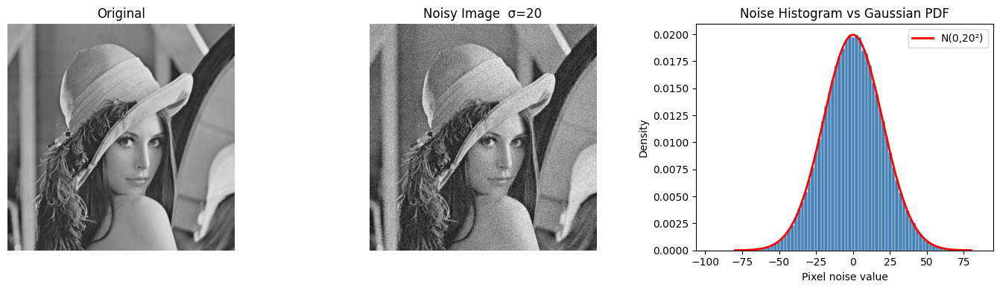

In [2]:
def add_gaussian_noise(image, sigma):
    """Add iid Gaussian noise N(0, sigma^2) to image — Eq.(1) in paper."""
    noise = np.random.normal(0, sigma, image.shape)
    noisy = image + noise
    return noisy, noise

def compute_mse(original, estimate):
    """Mean Squared Error — Eq.(2) in paper."""
    return np.mean((original - estimate) ** 2)

def psnr(original, estimate, max_val=255.0):
    mse = compute_mse(original, estimate)
    if mse == 0:
        return float('inf')
    return 10 * np.log10(max_val**2 / mse)

# ── Test with sigma = 20 (as in paper) ──────────────────────
SIGMA = 20
np.random.seed(0)
noisy_img, noise_added = add_gaussian_noise(img_gray, SIGMA)

print(f"Noise sigma = {SIGMA}")
print(f"Noisy image MSE (vs original): {compute_mse(img_gray, noisy_img):.2f}")
print(f"Expected MSE ≈ sigma² = {SIGMA**2}")

# ── Visualise noise distribution ─────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(14, 4))

axes[0].imshow(img_gray, cmap='gray', vmin=0, vmax=255)
axes[0].set_title('Original', fontsize=12)
axes[0].axis('off')

axes[1].imshow(np.clip(noisy_img, 0, 255), cmap='gray', vmin=0, vmax=255)
axes[1].set_title(f'Noisy Image  σ={SIGMA}', fontsize=12)
axes[1].axis('off')

axes[2].hist(noise_added.ravel(), bins=80, color='steelblue',
             edgecolor='white', linewidth=0.3, density=True)
x_range = np.linspace(-4*SIGMA, 4*SIGMA, 300)
axes[2].plot(x_range, norm.pdf(x_range, 0, SIGMA),
             'r-', lw=2, label=f'N(0,{SIGMA}²)')
axes[2].set_title('Noise Histogram vs Gaussian PDF', fontsize=12)
axes[2].set_xlabel('Pixel noise value')
axes[2].set_ylabel('Density')
axes[2].legend()

plt.tight_layout()
plt.savefig('02_noisy.png', dpi=100)
plt.show()

Subbands: ['LL', 'LH_4', 'HL_4', 'HH_4', 'LH_3', 'HL_3', 'HH_3', 'LH_2', 'HL_2', 'HH_2', 'LH_1', 'HL_1', 'HH_1']


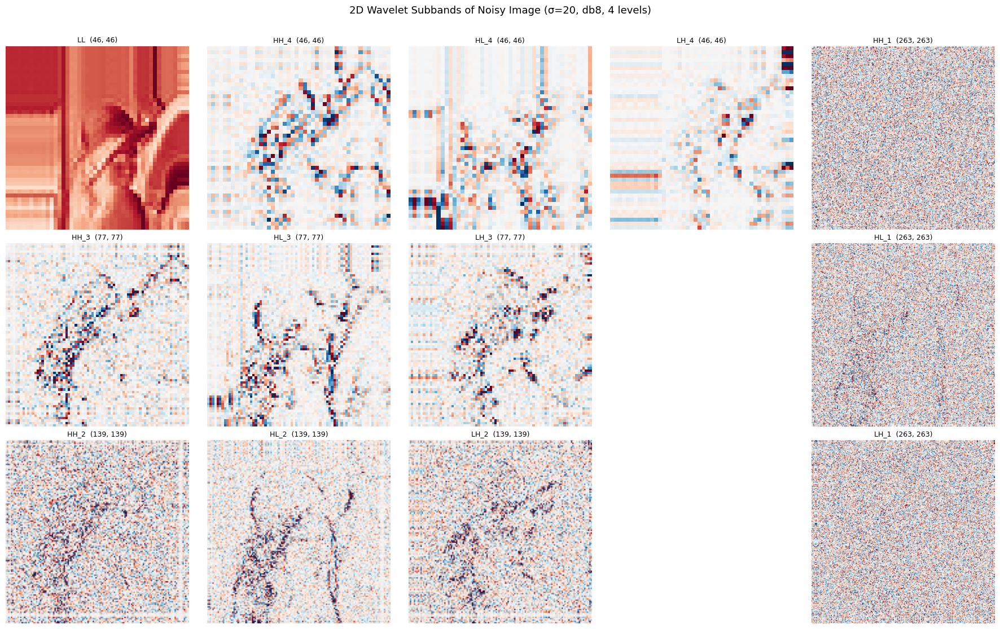

In [3]:
WAVELET = 'db8'     # Daubechies 8-tap (paper uses db8 — least asymmetric, 8 vanishing moments)
LEVELS  = 4         # 4-scale decomposition as in paper

def wavelet_decompose(image, wavelet=WAVELET, level=LEVELS):
    """2D orthogonal DWT. Returns coefficients list [(cA,(cH,cV,cD)), ...]."""
    coeffs = pywt.wavedec2(image, wavelet=wavelet, level=level)
    return coeffs

def wavelet_reconstruct(coeffs, wavelet=WAVELET):
    """Inverse 2D DWT."""
    return pywt.waverec2(coeffs, wavelet=wavelet)

def get_subband_dict(coeffs):
    """
    Return a flat dict  {'LL': ..., 'HH_1':..., 'HL_1':..., 'LH_1':..., ...}
    Scale 1 = finest (highest frequency), scale J = coarsest.
    """
    bands = {}
    bands['LL'] = coeffs[0]
    for k, (cH, cV, cD) in enumerate(coeffs[1:], start=1):
        scale = LEVELS - k + 1          # match paper: scale 1=finest
        bands[f'LH_{scale}'] = cH      # horizontal edges
        bands[f'HL_{scale}'] = cV      # vertical edges
        bands[f'HH_{scale}'] = cD      # diagonal edges
    return bands

# ── Decompose noisy image ─────────────────────────────────────
coeffs_noisy = wavelet_decompose(noisy_img)
bands = get_subband_dict(coeffs_noisy)
print("Subbands:", list(bands.keys()))

# ── Visualise all subbands ────────────────────────────────────
fig, axes = plt.subplots(3, 5, figsize=(18, 11))

subplot_map = [
    (0, 0, 'LL'),
    (0, 1, 'HH_4'), (0, 2, 'HL_4'), (0, 3, 'LH_4'),
    (1, 0, 'HH_3'), (1, 1, 'HL_3'), (1, 2, 'LH_3'),
    (2, 0, 'HH_2'), (2, 1, 'HL_2'), (2, 2, 'LH_2'),
    (0, 4, 'HH_1'), (1, 4, 'HL_1'), (2, 4, 'LH_1'),
]

for r, c, name in subplot_map:
    ax = axes[r][c]
    data = bands[name]
    vmax = np.percentile(np.abs(data), 99)
    ax.imshow(data, cmap='RdBu_r', vmin=-vmax, vmax=vmax)
    ax.set_title(f'{name}  {data.shape}', fontsize=9)
    ax.axis('off')

# Hide unused subplots
for r in range(3):
    for c in range(5):
        if not any(r==ri and c==ci for ri,ci,_ in subplot_map):
            axes[r][c].axis('off')

fig.suptitle('2D Wavelet Subbands of Noisy Image (σ=20, db8, 4 levels)',
             fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig('03_subbands.png', dpi=100, bbox_inches='tight')
plt.show()

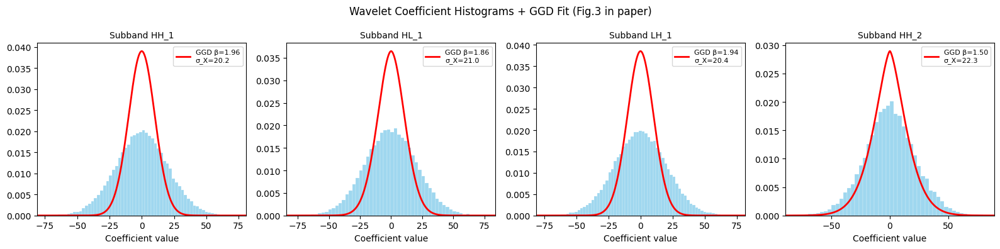

In [4]:
from scipy.special import gamma as gamma_fn

def ggd_pdf(x, sigma_x, beta):
    """Generalized Gaussian Distribution PDF — Eq.(5) in paper."""
    alpha = (1.0 / sigma_x) * np.sqrt(gamma_fn(1/beta) / gamma_fn(3/beta))
    C     = beta * alpha / (2 * gamma_fn(1/beta))
    return C * np.exp(-(alpha * np.abs(x))**beta)

def estimate_beta_from_kurtosis(kurtosis_val):
    """
    Solve kurtosis equation numerically to get GGD shape parameter β.
    kurtosis = Γ(1/β)·Γ(5/β) / Γ(3/β)²   — Eq.(27)
    """
    from scipy.optimize import brentq
    def kurtosis_eq(b):
        return (gamma_fn(1/b) * gamma_fn(5/b) / gamma_fn(3/b)**2) - kurtosis_val
    try:
        beta = brentq(kurtosis_eq, 0.1, 10.0)
    except:
        beta = 1.0   # fallback: Laplacian
    return beta

def estimate_ggd_params(subband_coeffs):
    """
    Estimate (sigma_x, beta) from subband data — Section II-B of paper.
    Uses method of moments on the observed noisy coefficients.
    """
    data   = subband_coeffs.ravel()
    n      = len(data)
    mu2    = np.mean(data**2)          # 2nd moment
    mu4    = np.mean(data**4)          # 4th moment
    if mu2 < 1e-10:
        return 0.0, 1.0
    kurtosis = mu4 / (mu2**2)          # normalised kurtosis of Y
    beta     = estimate_beta_from_kurtosis(kurtosis)
    sigma_x  = np.sqrt(mu2)
    return sigma_x, beta

# ── Show GGD fits for 4 fine-scale subbands ──────────────────
sample_bands = ['HH_1', 'HL_1', 'LH_1', 'HH_2']
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

for ax, bname in zip(axes, sample_bands):
    data = bands[bname].ravel()
    sx, beta = estimate_ggd_params(data)
    x_plot = np.linspace(-4*sx, 4*sx, 500)
    ggd_vals = ggd_pdf(x_plot, max(sx, 1e-6), beta)

    ax.hist(data, bins=80, density=True,
            color='skyblue', edgecolor='white', linewidth=0.2, alpha=0.8)
    ax.plot(x_plot, ggd_vals, 'r-', lw=2,
            label=f'GGD β={beta:.2f}\nσ_X={sx:.1f}')
    ax.set_title(f'Subband {bname}', fontsize=10)
    ax.set_xlim(-4*sx, 4*sx)
    ax.legend(fontsize=8)
    ax.set_xlabel('Coefficient value')

fig.suptitle('Wavelet Coefficient Histograms + GGD Fit (Fig.3 in paper)',
             fontsize=12)
plt.tight_layout()
plt.savefig('04_ggd_histograms.png', dpi=100)
plt.show()

In [5]:
def estimate_noise_sigma(coeffs):
    """
    Robust noise estimator from finest HH subband using median — Eq.(16).
    σ̂ = Median(|Y_ij|) / 0.6745
    """
    hh1 = coeffs[-1][2]   # finest-scale HH (diagonal) subband
    return np.median(np.abs(hh1)) / 0.6745

def estimate_signal_sigma(subband, noise_sigma):
    """
    Estimate signal std from observed subband — Eq.(17)-(20).
    σ_Y² = σ_X² + σ²  →  σ_X = sqrt(max(σ_Y² - σ², 0))
    """
    sigma_y2 = np.mean(subband**2)               # empirical 2nd moment Eq.(18)
    sigma_x  = np.sqrt(max(sigma_y2 - noise_sigma**2, 0.0))
    return sigma_x

def bayesshrink_threshold(subband, noise_sigma):
    """
    BayesShrink threshold — Eq.(19) / Section II-A of paper.
    T_B = σ² / σ_X
    If σ_X = 0, set T_B = max(|Y|) → zero all coefficients.
    """
    sigma_x = estimate_signal_sigma(subband, noise_sigma)
    if sigma_x < 1e-10:
        return np.max(np.abs(subband))
    return noise_sigma**2 / sigma_x

# ── Compute and display thresholds ───────────────────────────
noise_est = estimate_noise_sigma(coeffs_noisy)
print(f"True sigma   = {SIGMA}")
print(f"Estimated σ̂  = {noise_est:.4f}\n")

print(f"{'Subband':<12} {'σ_Y':>8} {'σ_X':>8} {'T_B (BayesShrink)':>20}")
print("-" * 52)
for bname, data in sorted(bands.items()):
    if bname == 'LL':
        continue
    sy = np.sqrt(np.mean(data**2))
    sx = estimate_signal_sigma(data, noise_est)
    tb = bayesshrink_threshold(data, noise_est)
    print(f"{bname:<12} {sy:>8.2f} {sx:>8.2f} {tb:>20.4f}")

True sigma   = 20
Estimated σ̂  = 20.0657

Subband           σ_Y      σ_X    T_B (BayesShrink)
----------------------------------------------------
HH_1            20.23     2.60             154.6761
HH_2            22.28     9.68              41.6062
HH_3            36.13    30.05              13.4006
HH_4            71.58    68.71               5.8599
HL_1            20.97     6.08              66.2282
HL_2            29.21    21.23              18.9678
HL_3            60.83    57.43               7.0110
HL_4           147.91   146.55               2.7475
LH_1            20.36     3.47             116.0526
LH_2            23.54    12.32              32.6897
LH_3            38.15    32.44              12.4097
LH_4           108.82   106.95               3.7646


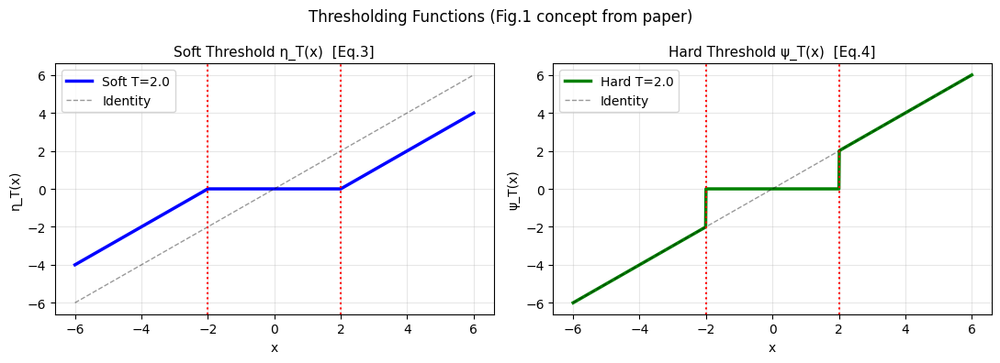

In [6]:
def soft_threshold(coeffs_array, T):
    """Soft-thresholding (shrinkage) — Eq.(3): sgn(x)·max(|x|−T, 0)."""
    return np.sign(coeffs_array) * np.maximum(np.abs(coeffs_array) - T, 0.0)

def hard_threshold(coeffs_array, T):
    """Hard-thresholding — Eq.(4): x if |x|>T, else 0."""
    result = coeffs_array.copy()
    result[np.abs(result) <= T] = 0.0
    return result

# ── Visualise the two thresholding functions ─────────────────
x = np.linspace(-6, 6, 1000)
T_demo = 2.0

fig, axes = plt.subplots(1, 2, figsize=(11, 4))

axes[0].plot(x, soft_threshold(x, T_demo), 'b-', lw=2.5,
             label=f'Soft T={T_demo}')
axes[0].plot(x, x, 'k--', lw=1, alpha=0.4, label='Identity')
axes[0].axvline( T_demo, color='r', ls=':', lw=1.5)
axes[0].axvline(-T_demo, color='r', ls=':', lw=1.5)
axes[0].set_title('Soft Threshold η_T(x)  [Eq.3]', fontsize=11)
axes[0].legend(); axes[0].grid(alpha=0.3)
axes[0].set_xlabel('x'); axes[0].set_ylabel('η_T(x)')

axes[1].plot(x, hard_threshold(x, T_demo), 'g-', lw=2.5,
             label=f'Hard T={T_demo}')
axes[1].plot(x, x, 'k--', lw=1, alpha=0.4, label='Identity')
axes[1].axvline( T_demo, color='r', ls=':', lw=1.5)
axes[1].axvline(-T_demo, color='r', ls=':', lw=1.5)
axes[1].set_title('Hard Threshold ψ_T(x)  [Eq.4]', fontsize=11)
axes[1].legend(); axes[1].grid(alpha=0.3)
axes[1].set_xlabel('x'); axes[1].set_ylabel('ψ_T(x)')

plt.suptitle('Thresholding Functions (Fig.1 concept from paper)', fontsize=12)
plt.tight_layout()
plt.savefig('05_threshold_functions.png', dpi=100)
plt.show()

σ (true) = 20  |  σ̂ (estimated) = 20.07

Method                      MSE    PSNR (dB)
--------------------------------------------
Noisy                    398.73        22.12
BayesShrink               60.22        30.33


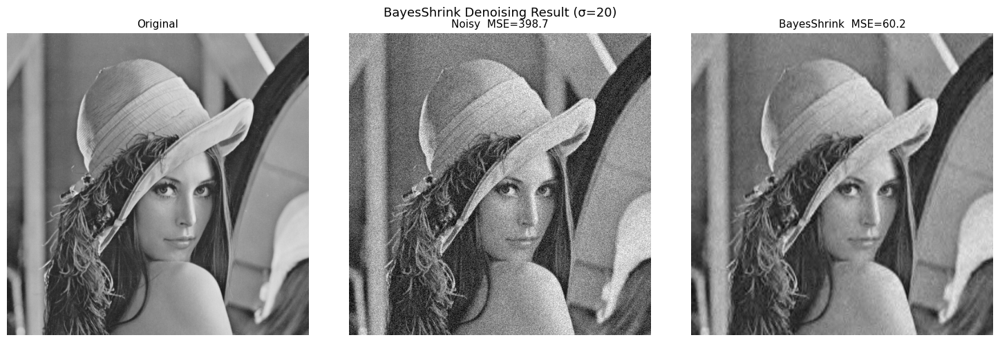

In [7]:
def bayesshrink_denoise(noisy_image, wavelet=WAVELET, level=LEVELS):
    """
    Full BayesShrink denoising pipeline — Section II of paper.
    1. 2D DWT
    2. Estimate noise σ from finest HH subband
    3. Per-subband: estimate σ_X, compute T_B, soft-threshold
    4. Inverse DWT
    """
    coeffs = wavelet_decompose(noisy_image, wavelet, level)
    noise_sigma = estimate_noise_sigma(coeffs)

    thresholded = [coeffs[0]]   # keep LL (approximation) unchanged

    threshold_log = {}
    for k, (cH, cV, cD) in enumerate(coeffs[1:], start=1):
        scale = level - k + 1
        new_bands = []
        for subband, name_prefix in [(cH,'LH'), (cV,'HL'), (cD,'HH')]:
            T = bayesshrink_threshold(subband, noise_sigma)
            thresholded_sub = soft_threshold(subband, T)
            new_bands.append(thresholded_sub)
            threshold_log[f'{name_prefix}_{scale}'] = T
        thresholded.append(tuple(new_bands))

    denoised = wavelet_reconstruct(thresholded, wavelet)
    denoised = np.clip(denoised, 0, 255)
    return denoised, noise_sigma, threshold_log

# ── Run BayesShrink ──────────────────────────────────────────
denoised_bayes, noise_est2, thresholds = bayesshrink_denoise(noisy_img)

mse_noisy   = compute_mse(img_gray, noisy_img)
mse_bayes   = compute_mse(img_gray, denoised_bayes)
psnr_noisy  = psnr(img_gray, noisy_img)
psnr_bayes  = psnr(img_gray, denoised_bayes)

print(f"σ (true) = {SIGMA}  |  σ̂ (estimated) = {noise_est2:.2f}")
print(f"\n{'Method':<20} {'MSE':>10} {'PSNR (dB)':>12}")
print("-" * 44)
print(f"{'Noisy':<20} {mse_noisy:>10.2f} {psnr_noisy:>12.2f}")
print(f"{'BayesShrink':<20} {mse_bayes:>10.2f} {psnr_bayes:>12.2f}")

# ── Visual comparison ─────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for ax, im, title in zip(axes,
        [img_gray, noisy_img, denoised_bayes],
        ['Original',
         f'Noisy  MSE={mse_noisy:.1f}',
         f'BayesShrink  MSE={mse_bayes:.1f}']):
    ax.imshow(np.clip(im, 0, 255), cmap='gray', vmin=0, vmax=255)
    ax.set_title(title, fontsize=11)
    ax.axis('off')

plt.suptitle(f'BayesShrink Denoising Result (σ={SIGMA})', fontsize=13)
plt.tight_layout()
plt.savefig('06_bayesshrink_result.png', dpi=100)
plt.show()


Method                    MSE    PSNR (dB)    Improvement
--------------------------------------------------------
Noisy                  398.73        22.12          +0.00
VisuShrink             150.44        26.36        +248.29
SureShrink              66.07        29.93        +332.66
BayesShrink             60.22        30.33        +338.51
Wiener                  82.15        28.98        +316.58


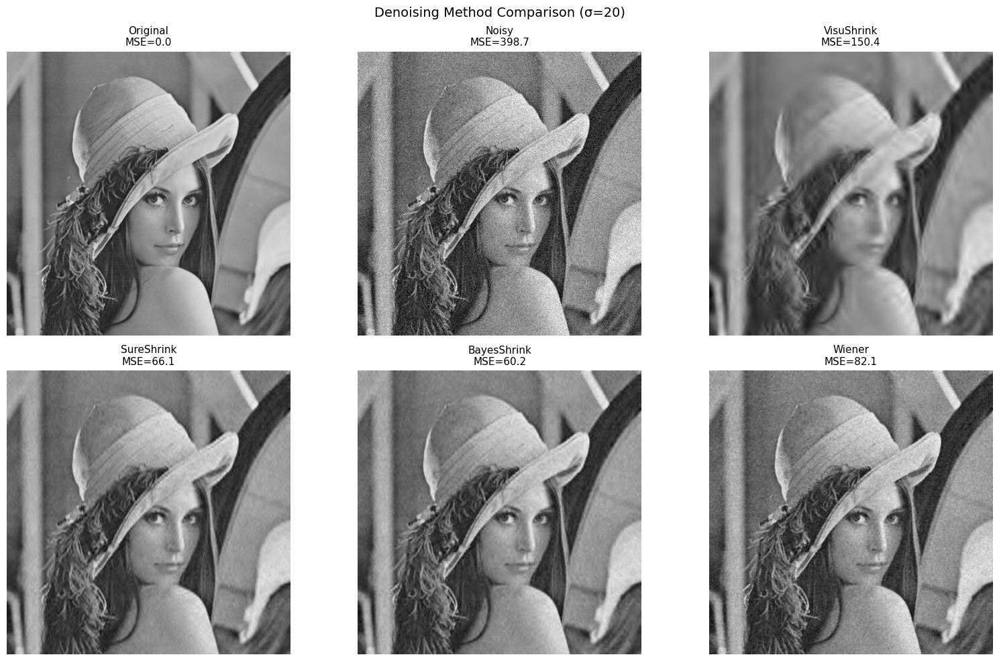

In [8]:
def visushrink_threshold(subband, noise_sigma):
    """
    Universal threshold — Donoho & Johnstone [14].
    T_U = σ · sqrt(2 · log(M))  where M = total number of samples.
    """
    M = subband.size
    return noise_sigma * np.sqrt(2 * np.log(M))

def sure_threshold(subband, noise_sigma):
    """
    SURE threshold — minimise Stein's Unbiased Risk Estimate [15].
    Searches over sorted |y| values for T that minimises SURE(T).
    """
    y    = subband.ravel()
    n    = len(y)
    abs_y = np.sort(np.abs(y))
    sigma2 = noise_sigma**2

    sure_vals = []
    for T in abs_y:
        num_below = np.sum(np.abs(y) <= T)
        sum_sq_min = np.sum(np.minimum(np.abs(y), T)**2)
        sure_t = n - 2*num_below + sum_sq_min / sigma2
        sure_vals.append(sure_t)

    best_T = abs_y[np.argmin(sure_vals)]

    # Hybrid: use universal threshold if subband is "sparse" (SureShrink rule)
    sparsity = np.sqrt(np.sum((y**2 / sigma2 - 1)**2))
    threshold_universal = visushrink_threshold(subband, noise_sigma)
    if sparsity < np.sqrt(n * np.log2(n)):
        return threshold_universal
    return best_T

def generic_denoise(noisy_image, threshold_fn, wavelet=WAVELET, level=LEVELS):
    """Generic wavelet denoising with pluggable threshold function."""
    coeffs = wavelet_decompose(noisy_image, wavelet, level)
    noise_sigma = estimate_noise_sigma(coeffs)
    thresholded = [coeffs[0]]
    for cH, cV, cD in coeffs[1:]:
        new_bands = [soft_threshold(sb, threshold_fn(sb, noise_sigma))
                     for sb in [cH, cV, cD]]
        thresholded.append(tuple(new_bands))
    denoised = np.clip(wavelet_reconstruct(thresholded, wavelet), 0, 255)
    return denoised

# ── Wiener filter baseline ───────────────────────────────────
from scipy.signal import wiener as scipy_wiener
denoised_wiener = np.clip(scipy_wiener(noisy_img, mysize=3), 0, 255)

# ── Run all methods ──────────────────────────────────────────
denoised_visu    = generic_denoise(noisy_img, visushrink_threshold)
denoised_sure    = generic_denoise(noisy_img, sure_threshold)

results = {
    'Noisy'        : noisy_img,
    'VisuShrink'   : denoised_visu,
    'SureShrink'   : denoised_sure,
    'BayesShrink'  : denoised_bayes,
    'Wiener'       : denoised_wiener,
}

print(f"\n{'Method':<18} {'MSE':>10} {'PSNR (dB)':>12} {'Improvement':>14}")
print("-" * 56)
for name, im in results.items():
    m = compute_mse(img_gray, im)
    p = psnr(img_gray, im)
    imp = mse_noisy - m
    print(f"{name:<18} {m:>10.2f} {p:>12.2f} {imp:>+14.2f}")

# ── Side-by-side comparison ──────────────────────────────────
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
titles = ['Original', 'Noisy', 'VisuShrink', 'SureShrink', 'BayesShrink', 'Wiener']
images = [img_gray, noisy_img, denoised_visu, denoised_sure, denoised_bayes, denoised_wiener]

for ax, im, title in zip(axes.ravel(), images, titles):
    ax.imshow(np.clip(im, 0, 255), cmap='gray', vmin=0, vmax=255)
    m = compute_mse(img_gray, im)
    ax.set_title(f'{title}\nMSE={m:.1f}', fontsize=11)
    ax.axis('off')

plt.suptitle(f'Denoising Method Comparison (σ={SIGMA})', fontsize=14)
plt.tight_layout()
plt.savefig('07_comparison_all.png', dpi=100)
plt.show()


Method                    MSE    PSNR (dB)    Improvement
--------------------------------------------------------
Noisy                  398.73        22.12          +0.00
VisuShrink             150.44        26.36        +248.29
SureShrink              66.07        29.93        +332.66
BayesShrink             60.22        30.33        +338.51
Wiener                  82.15        28.98        +316.58


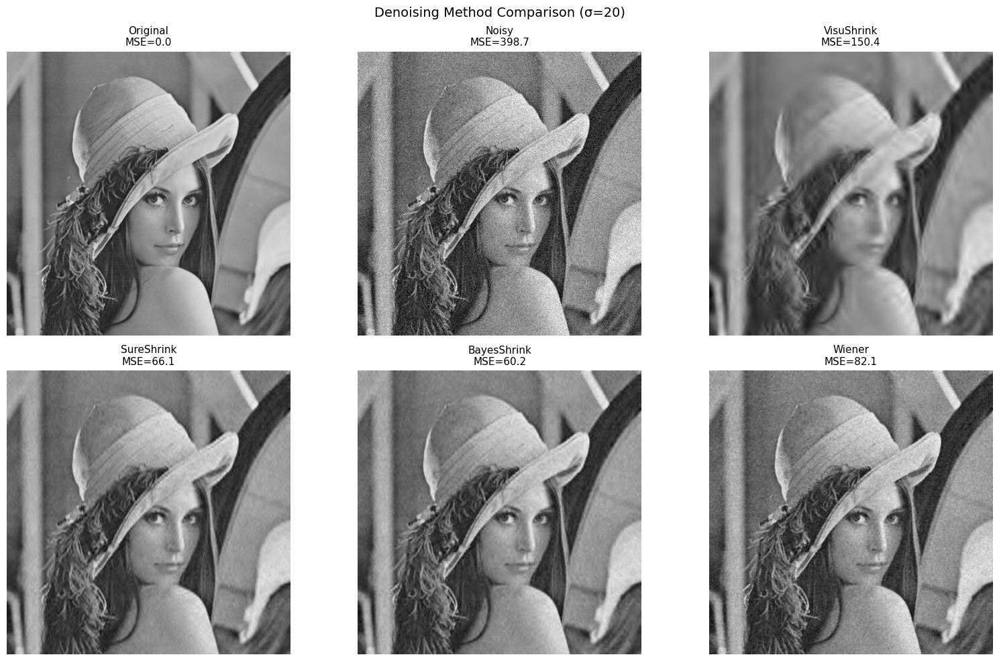

In [12]:
def visushrink_threshold(subband, noise_sigma):
    """
    Universal threshold — Donoho & Johnstone [14].
    T_U = σ · sqrt(2 · log(M))  where M = total number of samples.
    """
    M = subband.size
    return noise_sigma * np.sqrt(2 * np.log(M))

def sure_threshold(subband, noise_sigma):
    """
    SURE threshold — minimise Stein's Unbiased Risk Estimate [15].
    Searches over sorted |y| values for T that minimises SURE(T).
    """
    y    = subband.ravel()
    n    = len(y)
    abs_y = np.sort(np.abs(y))
    sigma2 = noise_sigma**2

    sure_vals = []
    for T in abs_y:
        num_below = np.sum(np.abs(y) <= T)
        sum_sq_min = np.sum(np.minimum(np.abs(y), T)**2)
        sure_t = n - 2*num_below + sum_sq_min / sigma2
        sure_vals.append(sure_t)

    best_T = abs_y[np.argmin(sure_vals)]

    # Hybrid: use universal threshold if subband is "sparse" (SureShrink rule)
    sparsity = np.sqrt(np.sum((y**2 / sigma2 - 1)**2))
    threshold_universal = visushrink_threshold(subband, noise_sigma)
    if sparsity < np.sqrt(n * np.log2(n)):
        return threshold_universal
    return best_T

def generic_denoise(noisy_image, threshold_fn, wavelet=WAVELET, level=LEVELS):
    """Generic wavelet denoising with pluggable threshold function."""
    coeffs = wavelet_decompose(noisy_image, wavelet, level)
    noise_sigma = estimate_noise_sigma(coeffs)
    thresholded = [coeffs[0]]
    for cH, cV, cD in coeffs[1:]:
        new_bands = [soft_threshold(sb, threshold_fn(sb, noise_sigma))
                     for sb in [cH, cV, cD]]
        thresholded.append(tuple(new_bands))
    denoised = np.clip(wavelet_reconstruct(thresholded, wavelet), 0, 255)
    return denoised

# ── Wiener filter baseline ───────────────────────────────────
from scipy.signal import wiener as scipy_wiener
denoised_wiener = np.clip(scipy_wiener(noisy_img, mysize=3), 0, 255)

# ── Run all methods ──────────────────────────────────────────
denoised_visu    = generic_denoise(noisy_img, visushrink_threshold)
denoised_sure    = generic_denoise(noisy_img, sure_threshold)

results = {
    'Noisy'        : noisy_img,
    'VisuShrink'   : denoised_visu,
    'SureShrink'   : denoised_sure,
    'BayesShrink'  : denoised_bayes,
    'Wiener'       : denoised_wiener,
}

print(f"\n{'Method':<18} {'MSE':>10} {'PSNR (dB)':>12} {'Improvement':>14}")
print("-" * 56)
for name, im in results.items():
    m = compute_mse(img_gray, im)
    p = psnr(img_gray, im)
    imp = mse_noisy - m
    print(f"{name:<18} {m:>10.2f} {p:>12.2f} {imp:>+14.2f}")

# ── Side-by-side comparison ──────────────────────────────────
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
titles = ['Original', 'Noisy', 'VisuShrink', 'SureShrink', 'BayesShrink', 'Wiener']
images = [img_gray, noisy_img, denoised_visu, denoised_sure, denoised_bayes, denoised_wiener]

for ax, im, title in zip(axes.ravel(), images, titles):
    ax.imshow(np.clip(im, 0, 255), cmap='gray', vmin=0, vmax=255)
    m = compute_mse(img_gray, im)
    ax.set_title(f'{title}\nMSE={m:.1f}', fontsize=11)
    ax.axis('off')

plt.suptitle(f'Denoising Method Comparison (σ={SIGMA})', fontsize=14)
plt.tight_layout()
plt.savefig('07_comparison_all.png', dpi=100)
plt.show()

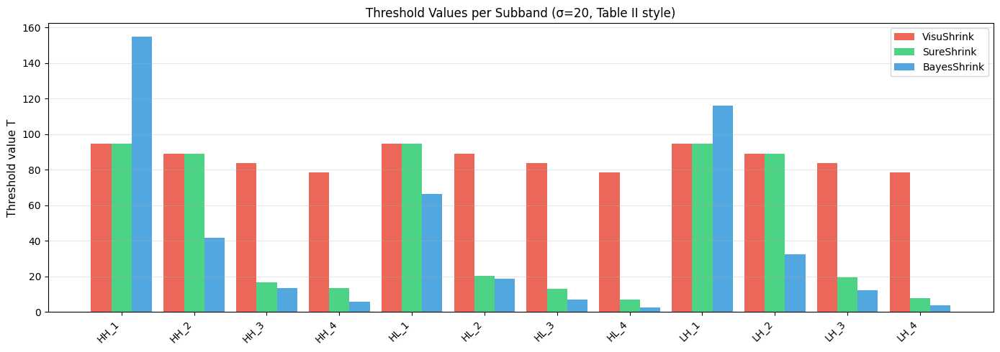


Threshold Table (BayesShrink):
Subband          VisuShrink     SureShrink    BayesShrink
--------------------------------------------------------
HH_1                  94.73          94.73         154.68
HH_2                  89.15          89.15          41.61
HH_3                  83.64          16.75          13.40
HH_4                  78.52          13.46           5.86
HL_1                  94.73          94.73          66.23
HL_2                  89.15          20.34          18.97
HL_3                  83.64          13.12           7.01
HL_4                  78.52           6.88           2.75
LH_1                  94.73          94.73         116.05
LH_2                  89.15          89.15          32.69
LH_3                  83.64          19.77          12.41
LH_4                  78.52           7.99           3.76


In [13]:
# ── Compare thresholds per subband across methods ─────────────
subband_names = [k for k in sorted(bands.keys()) if k != 'LL']
noise_s = estimate_noise_sigma(coeffs_noisy)

T_visu  = {b: visushrink_threshold(bands[b], noise_s) for b in subband_names}
T_sure  = {b: sure_threshold(bands[b], noise_s)       for b in subband_names}
T_bayes = {b: bayesshrink_threshold(bands[b], noise_s) for b in subband_names}

fig, ax = plt.subplots(figsize=(14, 5))
x_pos = np.arange(len(subband_names))
w = 0.28

ax.bar(x_pos - w,   [T_visu[b]  for b in subband_names], w,
       label='VisuShrink', color='#e74c3c', alpha=0.85)
ax.bar(x_pos,       [T_sure[b]  for b in subband_names], w,
       label='SureShrink', color='#2ecc71', alpha=0.85)
ax.bar(x_pos + w,   [T_bayes[b] for b in subband_names], w,
       label='BayesShrink', color='#3498db', alpha=0.85)

ax.set_xticks(x_pos)
ax.set_xticklabels(subband_names, rotation=45, ha='right')
ax.set_ylabel('Threshold value T', fontsize=11)
ax.set_title(f'Threshold Values per Subband (σ={SIGMA}, Table II style)',
             fontsize=12)
ax.legend(fontsize=10)
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig('08_threshold_comparison.png', dpi=100)
plt.show()

print("\nThreshold Table (BayesShrink):")
print(f"{'Subband':<12} {'VisuShrink':>14} {'SureShrink':>14} {'BayesShrink':>14}")
print("-" * 56)
for b in subband_names:
    print(f"{b:<12} {T_visu[b]:>14.2f} {T_sure[b]:>14.2f} {T_bayes[b]:>14.2f}")

Running experiments across sigma values (avg of 3 runs)...
  σ=10 done
  σ=20 done
  σ=30 done
  σ=35 done

σ              Noisy    VisuShrink    SureShrink   BayesShrink        Wiener
----------------------------------------------------------------------------
10           99.80         86.81         32.42         29.03 *       28.40  
20          399.65        150.18         65.57         59.90 *       82.09  
30          901.81        199.51        103.93         89.93 *      175.52  
35         1222.21        218.14        114.08        103.38 *      234.05  


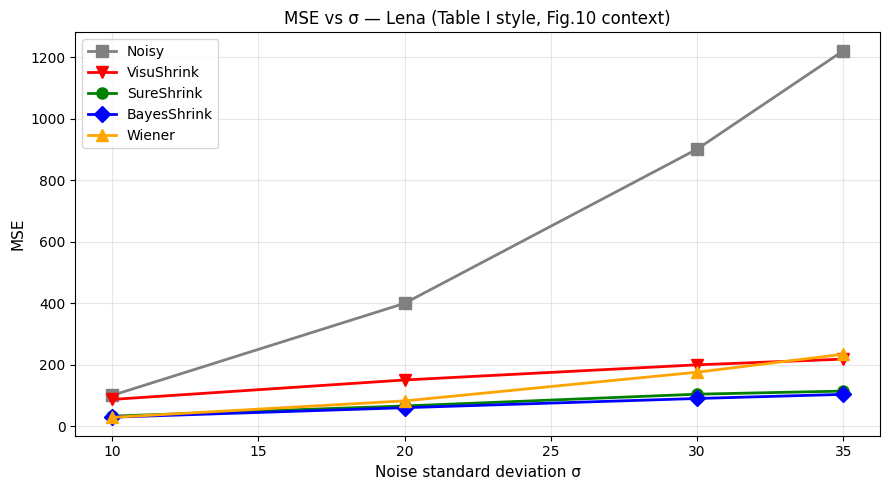

In [14]:
sigma_vals = [10, 20, 30, 35]
methods_fn = {
    'VisuShrink'  : lambda n: generic_denoise(n, visushrink_threshold),
    'SureShrink'  : lambda n: generic_denoise(n, sure_threshold),
    'BayesShrink' : lambda n: bayesshrink_denoise(n)[0],
    'Wiener'      : lambda n: np.clip(scipy_wiener(n, mysize=3), 0, 255),
}

results_table = {m: [] for m in methods_fn}
results_table['Noisy'] = []

print("Running experiments across sigma values (avg of 3 runs)...")
for sigma in sigma_vals:
    mse_acc = {m: 0.0 for m in list(methods_fn.keys()) + ['Noisy']}
    runs = 3
    for _ in range(runs):
        noisy, _ = add_gaussian_noise(img_gray, sigma)
        mse_acc['Noisy'] += compute_mse(img_gray, noisy) / runs
        for mname, fn in methods_fn.items():
            denoised = fn(noisy)
            mse_acc[mname] += compute_mse(img_gray, denoised) / runs
    for key in mse_acc:
        results_table[key].append(round(mse_acc[key], 2))
    print(f"  σ={sigma} done")

# ── Print table ───────────────────────────────────────────────
print(f"\n{'σ':<6}", end='')
for m in ['Noisy', 'VisuShrink', 'SureShrink', 'BayesShrink', 'Wiener']:
    print(f"{m:>14}", end='')
print()
print("-" * 76)
for i, sigma in enumerate(sigma_vals):
    print(f"{sigma:<6}", end='')
    for m in ['Noisy', 'VisuShrink', 'SureShrink', 'BayesShrink', 'Wiener']:
        best = min(results_table[m][i]
                   for m2 in ['SureShrink','BayesShrink']
                   for _ in [results_table[m2][i]])
        val = results_table[m][i]
        marker = ' *' if (m in ['SureShrink','BayesShrink'] and
                          val == min(results_table['SureShrink'][i],
                                     results_table['BayesShrink'][i])) else '  '
        print(f"{val:>12.2f}{marker}", end='')
    print()

# ── Plot ──────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(9, 5))
colors = {'Noisy':'gray','VisuShrink':'red','SureShrink':'green',
          'BayesShrink':'blue','Wiener':'orange'}
markers = {'Noisy':'s','VisuShrink':'v','SureShrink':'o',
           'BayesShrink':'D','Wiener':'^'}
for m in ['Noisy','VisuShrink','SureShrink','BayesShrink','Wiener']:
    ax.plot(sigma_vals, results_table[m], marker=markers[m],
            color=colors[m], lw=2, ms=8, label=m)
ax.set_xlabel('Noise standard deviation σ', fontsize=11)
ax.set_ylabel('MSE', fontsize=11)
ax.set_title('MSE vs σ — Lena (Table I style, Fig.10 context)', fontsize=12)
ax.legend(fontsize=10)
ax.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('09_mse_vs_sigma.png', dpi=100)
plt.show()

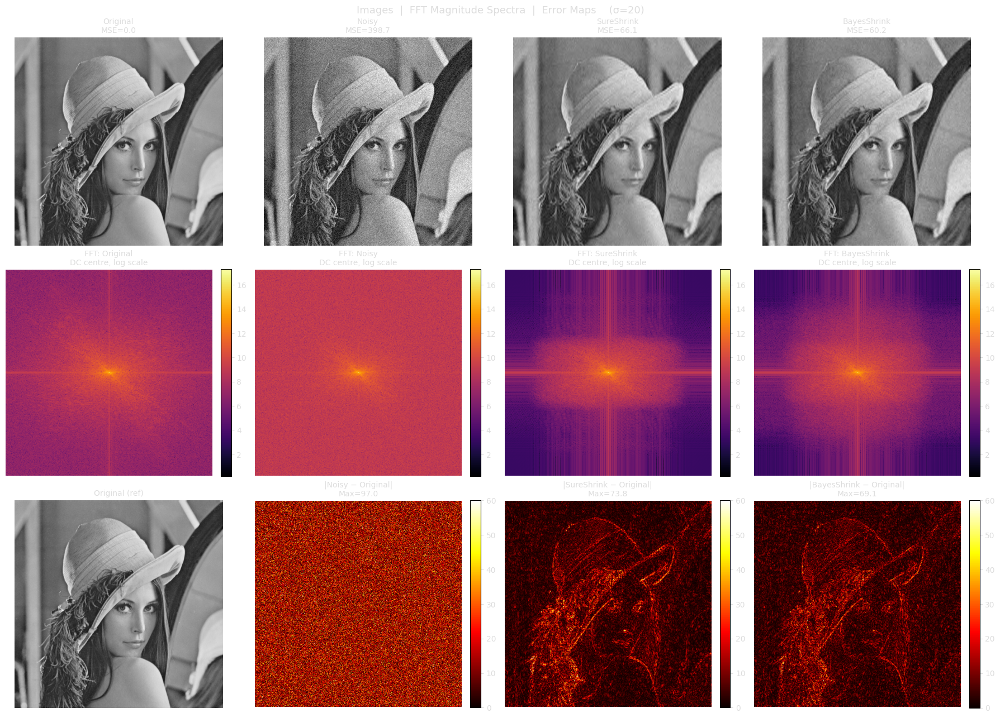

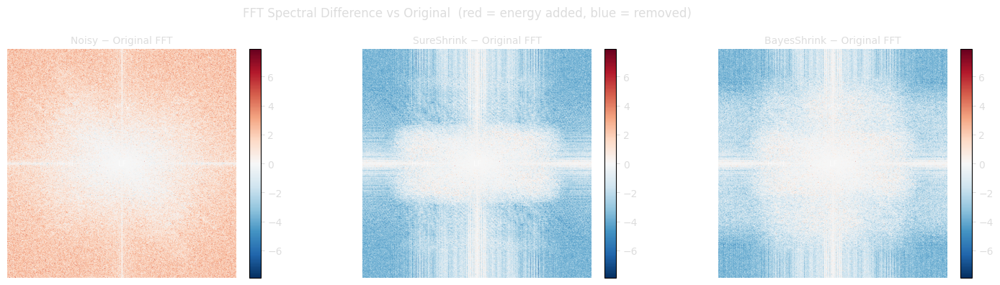

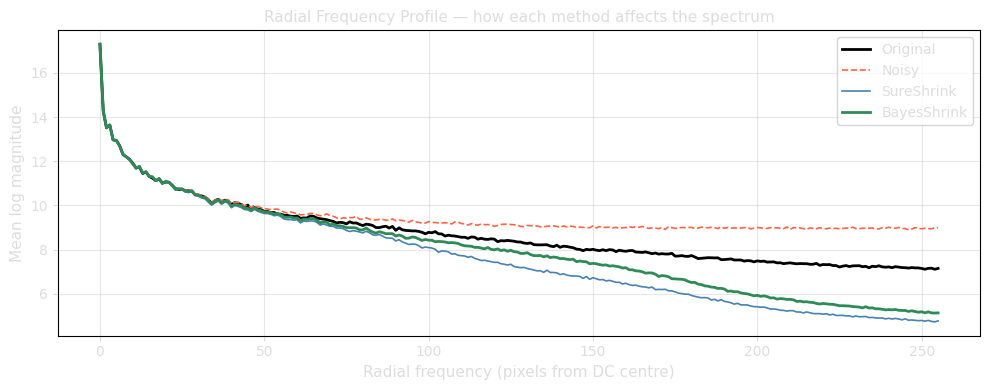


   FINAL SUMMARY — BayesShrink Implementation
  Image:          Lena 512×512 grayscale
  Wavelet:        db8 (Daubechies 8), 4 scales
  Noise σ (true): 20
  Noise σ (est.): 20.066



TypeError: 'numpy.float64' object is not callable

In [ ]:
# ── Error residual maps + FFT ─────────────────────────────────
fig, axes = plt.subplots(3, 4, figsize=(18, 13))

methods_display = [
    ('Original',    img_gray),
    ('Noisy',       noisy_img),
    ('SureShrink',  denoised_sure),
    ('BayesShrink', denoised_bayes),
]

def compute_fft_magnitude(image):
    """2D FFT shifted so DC is at centre, log-scaled magnitude spectrum."""
    f     = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)
    mag   = np.log1p(np.abs(fshift))   # log1p avoids log(0)
    return mag

# ── Row 0: images ─────────────────────────────────────────────
for ax, (name, im) in zip(axes[0], methods_display):
    ax.imshow(np.clip(im, 0, 255), cmap='gray', vmin=0, vmax=255)
    m = compute_mse(img_gray, im)
    ax.set_title(f'{name}\nMSE={m:.1f}', fontsize=10)
    ax.axis('off')

# ── Row 1: FFT magnitude spectra ──────────────────────────────
fft_mags = [compute_fft_magnitude(np.clip(im, 0, 255)) for _, im in methods_display]
vmin_fft  = min(m.min() for m in fft_mags)
vmax_fft  = max(m.max() for m in fft_mags)   # shared scale across all four

for ax, (name, im), mag in zip(axes[1], methods_display, fft_mags):
    im_show = ax.imshow(mag, cmap='inferno', vmin=vmin_fft, vmax=vmax_fft)
    ax.set_title(f'FFT: {name}\nDC centre, log scale', fontsize=10)
    ax.axis('off')
    plt.colorbar(im_show, ax=ax, fraction=0.046, pad=0.04)

# ── Row 2: error maps |image - original| ─────────────────────
# first cell: repeat original as reference
axes[2][0].imshow(np.clip(img_gray, 0, 255), cmap='gray', vmin=0, vmax=255)
axes[2][0].set_title('Original (ref)', fontsize=10)
axes[2][0].axis('off')

for ax, (name, im) in zip(axes[2][1:], methods_display[1:]):
    err     = np.abs(np.clip(im, 0, 255) - img_gray)
    im_show = ax.imshow(err, cmap='hot', vmin=0, vmax=60)
    ax.set_title(f'|{name} − Original|\nMax={err.max():.1f}', fontsize=10)
    ax.axis('off')
    plt.colorbar(im_show, ax=ax, fraction=0.046, pad=0.04)

plt.suptitle(
    f'Images  |  FFT Magnitude Spectra  |  Error Maps    (σ={SIGMA})',
    fontsize=13
)
plt.tight_layout()
plt.savefig('10_error_maps_fft.png', dpi=100, bbox_inches='tight')
plt.show()

# ── FFT difference: how each method changes the spectrum ──────
fig2, axes2 = plt.subplots(1, 3, figsize=(15, 4))

fft_orig = compute_fft_magnitude(img_gray)
comparisons = [
    ('Noisy − Original FFT',       noisy_img),
    ('SureShrink − Original FFT',  denoised_sure),
    ('BayesShrink − Original FFT', denoised_bayes),
]

diff_mags = [compute_fft_magnitude(np.clip(im, 0, 255)) - fft_orig
             for _, im in comparisons]
vlim = max(abs(d).max() for d in diff_mags)

for ax, (title, _), diff in zip(axes2, comparisons, diff_mags):
    im_show = ax.imshow(diff, cmap='RdBu_r', vmin=-vlim, vmax=vlim)
    ax.set_title(title, fontsize=10)
    ax.axis('off')
    plt.colorbar(im_show, ax=ax, fraction=0.046, pad=0.04)
    # annotate quadrants
    h, w = diff.shape
    for label, x, y in [('LF', w//2, h//2), ('HF-H', w//4, h//2),
                         ('HF-V', w//2, h//4)]:
        ax.text(x, y, label, color='white', fontsize=7,
                ha='center', va='center', alpha=0.6)

fig2.suptitle(
    'FFT Spectral Difference vs Original  (red = energy added, blue = removed)',
    fontsize=12
)
plt.tight_layout()
plt.savefig('10_fft_diff.png', dpi=100, bbox_inches='tight')
plt.show()

# ── Radial frequency profile ──────────────────────────────────
def radial_profile(mag):
    """Average FFT magnitude as a function of radial frequency (DC=0)."""
    h, w   = mag.shape
    cy, cx = h // 2, w // 2
    Y, X   = np.ogrid[:h, :w]
    R      = np.sqrt((X - cx)**2 + (Y - cy)**2).astype(int)
    max_r  = min(cx, cy)
    profile = np.array([mag[R == r].mean() if (R == r).any() else 0
                        for r in range(max_r)])
    return profile

fig3, ax3 = plt.subplots(figsize=(10, 4))
colors_map = {'Original':'black', 'Noisy':'tomato',
              'SureShrink':'steelblue', 'BayesShrink':'seagreen'}
for (name, im), mag in zip(methods_display, fft_mags):
    profile = radial_profile(mag)
    ax3.plot(profile, label=name, color=colors_map[name],
             lw=2 if name in ('Original','BayesShrink') else 1.2,
             ls='-' if name != 'Noisy' else '--')

ax3.set_xlabel('Radial frequency (pixels from DC centre)', fontsize=11)
ax3.set_ylabel('Mean log magnitude', fontsize=11)
ax3.set_title('Radial Frequency Profile — how each method affects the spectrum', fontsize=11)
ax3.legend(fontsize=10)
ax3.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('10_radial_profile.png', dpi=100)
plt.show()

# ── Final summary stats ───────────────────────────────────────
print("\n" + "="*55)
print("   FINAL SUMMARY — BayesShrink Implementation")
print("="*55)
print(f"  Image:          Lena 512×512 grayscale")
print(f"  Wavelet:        {WAVELET} (Daubechies 8), {LEVELS} scales")
print(f"  Noise σ (true): {SIGMA}")
print(f"  Noise σ (est.): {noise_est2:.3f}\n")
for name, im in [('Noisy', noisy_img), ('VisuShrink', denoised_visu),
                  ('SureShrink', denoised_sure),
                  ('BayesShrink', denoised_bayes),
                  ('Wiener', denoised_wiener)]:
    m = compute_mse(img_gray, im)
    p = psnr(img_gray, im)
    print(f"  {name:<15} MSE={m:7.2f}  PSNR={p:.2f} dB")
print("="*55)


  Salt & pepper noise — amount=5%
  Method                MSE   PSNR (dB)
----------------------------------------
  Original             0.00         inf
  S&P noisy          912.62       18.53
  BayesShrink        613.48       20.25
  Median 3×3          21.87       34.73


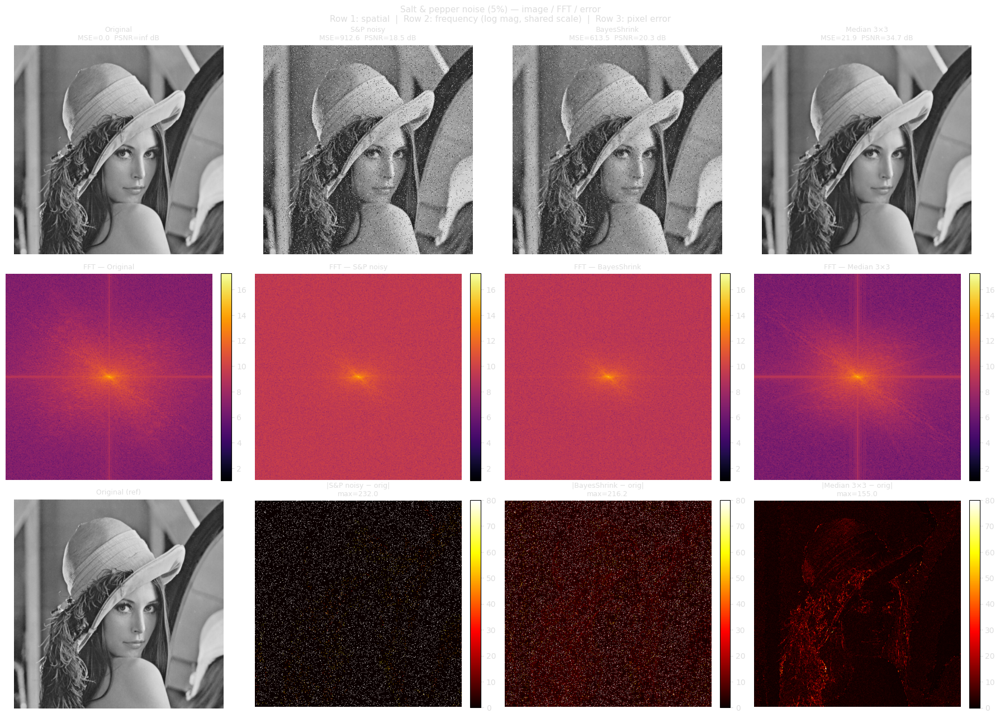

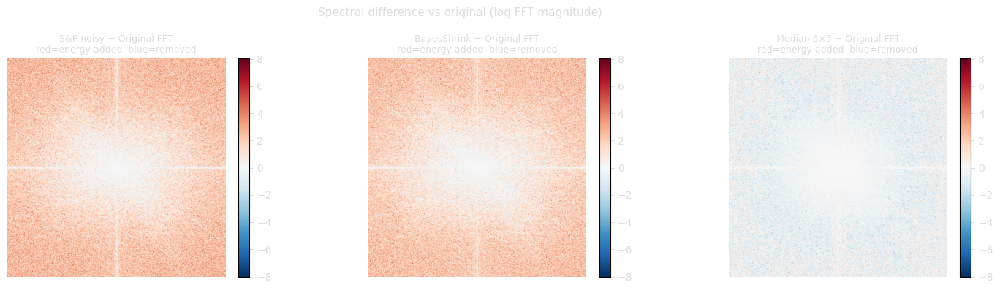

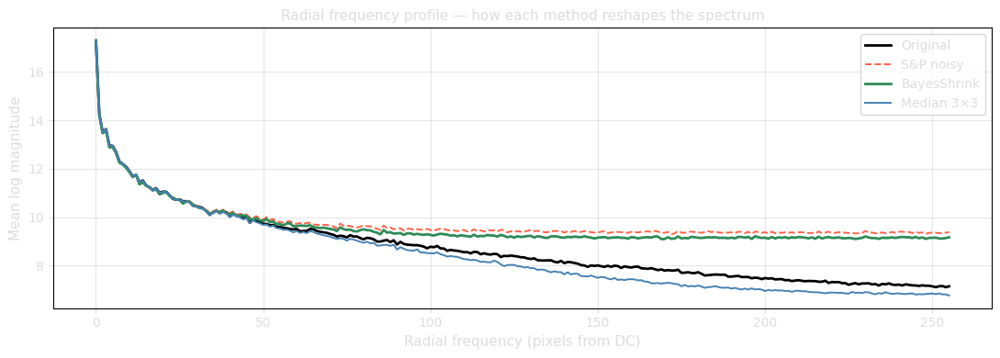

In [34]:
# ── Salt & pepper noise + BayesShrink + FFT comparison ────────
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pywt

def add_salt_pepper(image, amount=0.05, salt_ratio=0.5):
    """Add salt & pepper noise — amount = fraction of pixels corrupted."""
    noisy = image.copy()
    total = image.size
    n_salt   = int(total * amount * salt_ratio)
    n_pepper = int(total * amount * (1 - salt_ratio))
    # salt
    coords = [np.random.randint(0, i, n_salt) for i in image.shape]
    noisy[coords[0], coords[1]] = 255
    # pepper
    coords = [np.random.randint(0, i, n_pepper) for i in image.shape]
    noisy[coords[0], coords[1]] = 0
    return noisy

def estimate_noise_sigma(coeffs):
    hh1 = coeffs[-1][2]
    return np.median(np.abs(hh1)) / 0.6745

def estimate_signal_sigma(subband, noise_sigma):
    sigma_y2 = np.mean(subband ** 2)
    return np.sqrt(max(sigma_y2 - noise_sigma ** 2, 0.0))

def soft_threshold(arr, T):
    return np.sign(arr) * np.maximum(np.abs(arr) - T, 0.0)

def bayesshrink_threshold(subband, noise_sigma):
    sx = estimate_signal_sigma(subband, noise_sigma)
    if sx < 1e-10:
        return np.max(np.abs(subband))
    return (noise_sigma ** 2) / sx

def bayesshrink_denoise(image, wavelet='db8', level=4):
    coeffs = pywt.wavedec2(image, wavelet=wavelet, level=level)
    noise_sigma = estimate_noise_sigma(coeffs)
    thresholded = [coeffs[0]]
    for cH, cV, cD in coeffs[1:]:
        new_bands = [soft_threshold(sb, bayesshrink_threshold(sb, noise_sigma))
                     for sb in [cH, cV, cD]]
        thresholded.append(tuple(new_bands))
    denoised = pywt.waverec2(thresholded, wavelet)
    h, w = image.shape
    return np.clip(denoised[:h, :w], 0, 255)

def median_filter(image, ksize=3):
    return cv2.medianBlur(image.astype(np.uint8), ksize).astype(np.float64)

def compute_fft(image):
    f      = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)
    return np.log1p(np.abs(fshift))

def calc_mse(a, b):
    return np.mean((a - b) ** 2)

def calc_psnr(a, b, maxval=255.0):
    mse = calc_mse(a, b)
    return float('inf') if mse == 0 else 10 * np.log10(maxval ** 2 / mse)

def radial_profile(mag):
    h, w   = mag.shape
    cy, cx = h // 2, w // 2
    Y, X   = np.ogrid[:h, :w]
    R      = np.sqrt((X - cx) ** 2 + (Y - cy) ** 2).astype(int)
    max_r  = min(cx, cy)
    return np.array([mag[R == r].mean() if (R == r).any() else 0
                     for r in range(max_r)])

# ── Run ───────────────────────────────────────────────────────
np.random.seed(42)
SP_AMOUNT = 0.05          # 5 % of pixels corrupted

noisy_sp      = add_salt_pepper(img_gray, amount=SP_AMOUNT)
denoised_bs   = bayesshrink_denoise(noisy_sp)          # our method
denoised_med  = median_filter(noisy_sp, ksize=3)       # classical S&P fix

images = {
    'Original'   : img_gray,
    'S&P noisy'  : noisy_sp,
    'BayesShrink': denoised_bs,
    'Median 3×3' : denoised_med,
}

ffts    = {k: compute_fft(v)    for k, v in images.items()}
fft_min = min(v.min() for v in ffts.values())
fft_max = max(v.max() for v in ffts.values())

print("\n" + "="*52)
print(f"  Salt & pepper noise — amount={SP_AMOUNT*100:.0f}%")
print("="*52)
print(f"  {'Method':<16} {'MSE':>8}  {'PSNR (dB)':>10}")
print("-"*40)
for name, im in images.items():
    m = calc_mse(img_gray, im)
    p = calc_psnr(img_gray, im)
    print(f"  {name:<16} {m:>8.2f}  {p:>10.2f}")
print("="*52)

# ── Figure 1: 3-row grid  (image / FFT / error) ───────────────
fig, axes = plt.subplots(3, 4, figsize=(18, 13))
keys = list(images.keys())

for col, name in enumerate(keys):
    im = images[name]

    # row 0 — image
    axes[0][col].imshow(np.clip(im, 0, 255), cmap='gray', vmin=0, vmax=255)
    m = calc_mse(img_gray, im); p = calc_psnr(img_gray, im)
    axes[0][col].set_title(f'{name}\nMSE={m:.1f}  PSNR={p:.1f} dB', fontsize=9)
    axes[0][col].axis('off')

    # row 1 — FFT magnitude
    im_s = axes[1][col].imshow(ffts[name], cmap='inferno',
                                vmin=fft_min, vmax=fft_max)
    axes[1][col].set_title(f'FFT — {name}', fontsize=9)
    axes[1][col].axis('off')
    plt.colorbar(im_s, ax=axes[1][col], fraction=0.046, pad=0.04)

    # row 2 — error map vs original
    if name == 'Original':
        axes[2][col].imshow(np.clip(img_gray, 0, 255), cmap='gray', vmin=0, vmax=255)
        axes[2][col].set_title('Original (ref)', fontsize=9)
    else:
        err    = np.abs(np.clip(im, 0, 255) - img_gray)
        im_e   = axes[2][col].imshow(err, cmap='hot', vmin=0, vmax=80)
        axes[2][col].set_title(f'|{name} − orig|\nmax={err.max():.1f}', fontsize=9)
        plt.colorbar(im_e, ax=axes[2][col], fraction=0.046, pad=0.04)
    axes[2][col].axis('off')

fig.suptitle(
    f'Salt & pepper noise ({SP_AMOUNT*100:.0f}%) — image / FFT / error\n'
    'Row 1: spatial  |  Row 2: frequency (log mag, shared scale)  |  Row 3: pixel error',
    fontsize=11
)
plt.tight_layout()
plt.savefig('sp_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

# ── Figure 2: FFT spectral difference vs original ─────────────
fig2, axes2 = plt.subplots(1, 3, figsize=(15, 4))
compare_names = ['S&P noisy', 'BayesShrink', 'Median 3×3']
diffs  = [ffts[n] - ffts['Original'] for n in compare_names]
vlim   = max(abs(d).max() for d in diffs)

for ax, name, diff in zip(axes2, compare_names, diffs):
    im_s = ax.imshow(diff, cmap='RdBu_r', vmin=-vlim, vmax=vlim)
    ax.set_title(f'{name} − Original FFT\n'
                 f'red=energy added  blue=removed', fontsize=9)
    ax.axis('off')
    plt.colorbar(im_s, ax=ax, fraction=0.046, pad=0.04)

fig2.suptitle('Spectral difference vs original (log FFT magnitude)',
              fontsize=11)
plt.tight_layout()
plt.savefig('sp_fft_diff.png', dpi=150, bbox_inches='tight')
plt.show()

# ── Figure 3: radial frequency profiles ───────────────────────
fig3, ax3 = plt.subplots(figsize=(11, 4))
style = {
    'Original'   : ('black',     2.0, '-'),
    'S&P noisy'  : ('tomato',    1.4, '--'),
    'BayesShrink': ('seagreen',  2.0, '-'),
    'Median 3×3' : ('steelblue', 1.4, '-'),
}
for name, mag in ffts.items():
    col, lw, ls = style[name]
    ax3.plot(radial_profile(mag), label=name, color=col, lw=lw, ls=ls)

ax3.set_xlabel('Radial frequency (pixels from DC)', fontsize=11)
ax3.set_ylabel('Mean log magnitude', fontsize=11)
ax3.set_title('Radial frequency profile — how each method reshapes the spectrum',
              fontsize=11)
ax3.legend(fontsize=10)
ax3.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('sp_radial.png', dpi=150, bbox_inches='tight')
plt.show()